In [220]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import accuracy_score,classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
import warnings
warnings.filterwarnings('ignore')

### DATASET

In [141]:
a=pd.read_csv('air_quality_health_impact_data.csv.zip')
a

,RecordID,AQI,PM10,PM2_5,NO2,SO2,O3,Temperature,Humidity,WindSpeed,RespiratoryCases,CardiovascularCases,HospitalAdmissions,HealthImpactScore,HealthImpactClass
0,1,187.270059,295.853039,13.038560,6.639263,66.161150,54.624280,5.150335,84.424344,6.137755,7,5,1,97.244041,0.0
1,2,475.357153,246.254703,9.984497,16.318326,90.499523,169.621728,1.543378,46.851415,4.521422,10,2,0,100.000000,0.0
2,3,365.996971,84.443191,23.111340,96.317811,17.875850,9.006794,1.169483,17.806977,11.157384,13,3,0,100.000000,0.0
3,4,299.329242,21.020609,14.273403,81.234403,48.323616,93.161033,21.925276,99.473373,15.302500,8,8,1,100.000000,0.0
4,5,78.009320,16.987667,152.111623,121.235461,90.866167,241.795138,9.217517,24.906837,14.534733,9,0,1,95.182643,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5806,5807,171.112762,11.246387,197.984628,158.643107,17.743678,280.370909,37.359323,61.707640,4.097129,14,5,2,100.000000,4.0
5807,5808,490.691667,275.340762,55.774170,132.336871,29.334724,108.043492,34.532542,21.528555,6.682549,8,6,2,100.000000,3.0
5808,5809,314.841798,41.892699,184.708551,82.105823,68.334578,105.568503,22.975564,92.725625,2.889698,12,2,3,100.000000,1.0
5809,5810,208.080473,165.533785,199.177255,100.796385,87.586488,166.469537,36.090620,25.836286,10.722393,6,2,3,100.000000,4.0


In [143]:
a=a.drop('RecordID',axis=1)
a

,AQI,PM10,PM2_5,NO2,SO2,O3,Temperature,Humidity,WindSpeed,RespiratoryCases,CardiovascularCases,HospitalAdmissions,HealthImpactScore,HealthImpactClass
0,187.270059,295.853039,13.038560,6.639263,66.161150,54.624280,5.150335,84.424344,6.137755,7,5,1,97.244041,0.0
1,475.357153,246.254703,9.984497,16.318326,90.499523,169.621728,1.543378,46.851415,4.521422,10,2,0,100.000000,0.0
2,365.996971,84.443191,23.111340,96.317811,17.875850,9.006794,1.169483,17.806977,11.157384,13,3,0,100.000000,0.0
3,299.329242,21.020609,14.273403,81.234403,48.323616,93.161033,21.925276,99.473373,15.302500,8,8,1,100.000000,0.0
4,78.009320,16.987667,152.111623,121.235461,90.866167,241.795138,9.217517,24.906837,14.534733,9,0,1,95.182643,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5806,171.112762,11.246387,197.984628,158.643107,17.743678,280.370909,37.359323,61.707640,4.097129,14,5,2,100.000000,4.0
5807,490.691667,275.340762,55.774170,132.336871,29.334724,108.043492,34.532542,21.528555,6.682549,8,6,2,100.000000,3.0
5808,314.841798,41.892699,184.708551,82.105823,68.334578,105.568503,22.975564,92.725625,2.889698,12,2,3,100.000000,1.0
5809,208.080473,165.533785,199.177255,100.796385,87.586488,166.469537,36.090620,25.836286,10.722393,6,2,3,100.000000,4.0


In [145]:
a.value_counts('HealthImpactClass')

HealthImpactClass
0.0    4808
1.0     579
2.0     273
3.0      95
4.0      56
Name: count, dtype: int64

### PREPROCESSING

In [147]:
a.shape

(5811, 14)

In [149]:
a.dtypes

AQI                    float64
PM10                   float64
PM2_5                  float64
NO2                    float64
SO2                    float64
O3                     float64
Temperature            float64
Humidity               float64
WindSpeed              float64
RespiratoryCases         int64
CardiovascularCases      int64
HospitalAdmissions       int64
HealthImpactScore      float64
HealthImpactClass      float64
dtype: object

In [151]:
a.size

81354

In [153]:
a.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5811 entries, 0 to 5810
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   AQI                  5811 non-null   float64
 1   PM10                 5811 non-null   float64
 2   PM2_5                5811 non-null   float64
 3   NO2                  5811 non-null   float64
 4   SO2                  5811 non-null   float64
 5   O3                   5811 non-null   float64
 6   Temperature          5811 non-null   float64
 7   Humidity             5811 non-null   float64
 8   WindSpeed            5811 non-null   float64
 9   RespiratoryCases     5811 non-null   int64  
 10  CardiovascularCases  5811 non-null   int64  
 11  HospitalAdmissions   5811 non-null   int64  
 12  HealthImpactScore    5811 non-null   float64
 13  HealthImpactClass    5811 non-null   float64
dtypes: float64(11), int64(3)
memory usage: 635.7 KB


In [155]:
a.describe()

,AQI,PM10,PM2_5,NO2,SO2,O3,Temperature,Humidity,WindSpeed,RespiratoryCases,CardiovascularCases,HospitalAdmissions,HealthImpactScore,HealthImpactClass
count,5811.000000,5811.000000,5811.000000,5811.000000,5811.000000,5811.000000,5811.000000,5811.000000,5811.000000,5811.000000,5811.000000,5811.000000,5811.000000,5811.000000
mean,248.438476,148.654997,100.223714,102.293445,49.456838,149.312431,14.975500,54.776853,9.989177,9.974187,4.988986,2.001033,93.785223,0.281191
std,144.777638,85.698500,58.096612,57.713175,28.530329,86.534240,14.483067,26.020786,5.776950,3.129234,2.216791,1.398794,13.318904,0.714075
min,0.005817,0.015848,0.031549,0.009625,0.011023,0.001661,-9.990998,10.001506,0.002094,1.000000,0.000000,0.000000,22.448488,0.000000
25%,122.951293,75.374954,49.435171,53.538538,24.887264,73.999665,2.481500,31.995262,4.952343,8.000000,3.000000,1.000000,98.203057,0.000000
50%,249.127841,147.634997,100.506337,102.987736,49.530165,149.559871,14.942428,54.543904,10.051742,10.000000,5.000000,2.000000,100.000000,0.000000
75%,373.630668,222.436759,151.340260,151.658516,73.346617,223.380126,27.465374,77.641639,14.971840,12.000000,6.000000,3.000000,100.000000,0.000000
max,499.858837,299.901962,199.984965,199.980195,99.969561,299.936812,39.963434,99.997493,19.999139,23.000000,14.000000,12.000000,100.000000,4.000000


In [157]:
a.isnull().sum()

AQI                    0
PM10                   0
PM2_5                  0
NO2                    0
SO2                    0
O3                     0
Temperature            0
Humidity               0
WindSpeed              0
RespiratoryCases       0
CardiovascularCases    0
HospitalAdmissions     0
HealthImpactScore      0
HealthImpactClass      0
dtype: int64

In [159]:
a.duplicated().sum()

0

### EDA (Exploratory Data Analysis)

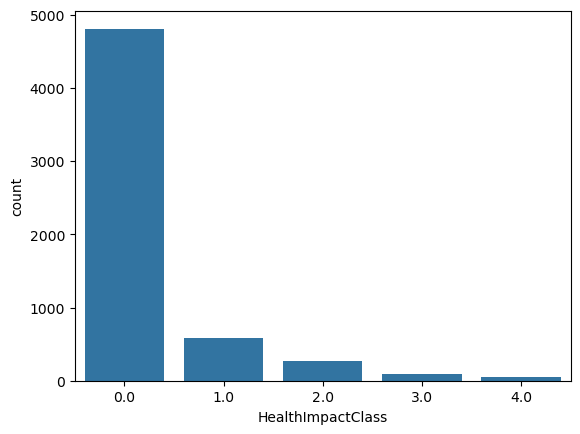

<Figure size 640x480 with 0 Axes>

In [161]:
sns.countplot(data=a,x='HealthImpactClass')
plt.show()
plt.savefig('count plot of HealthImpactClass.png')


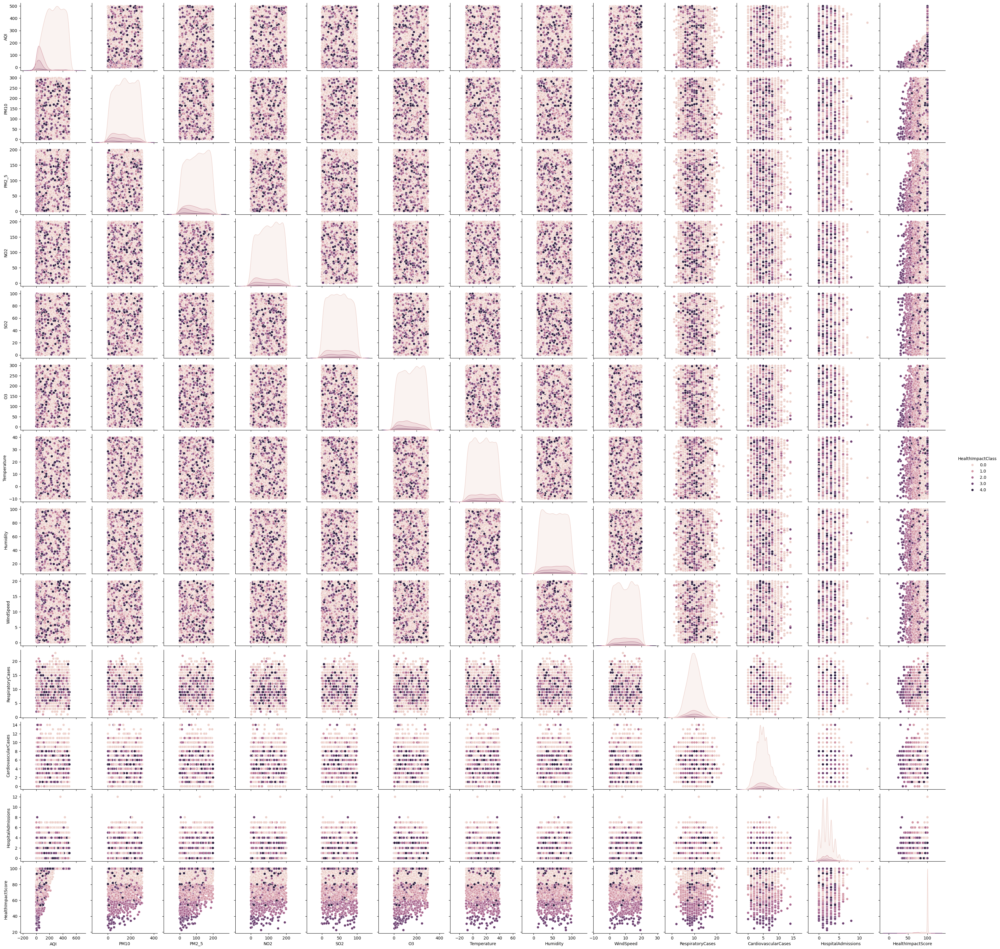

In [163]:
sns.pairplot(a,hue='HealthImpactClass')
plt.show()

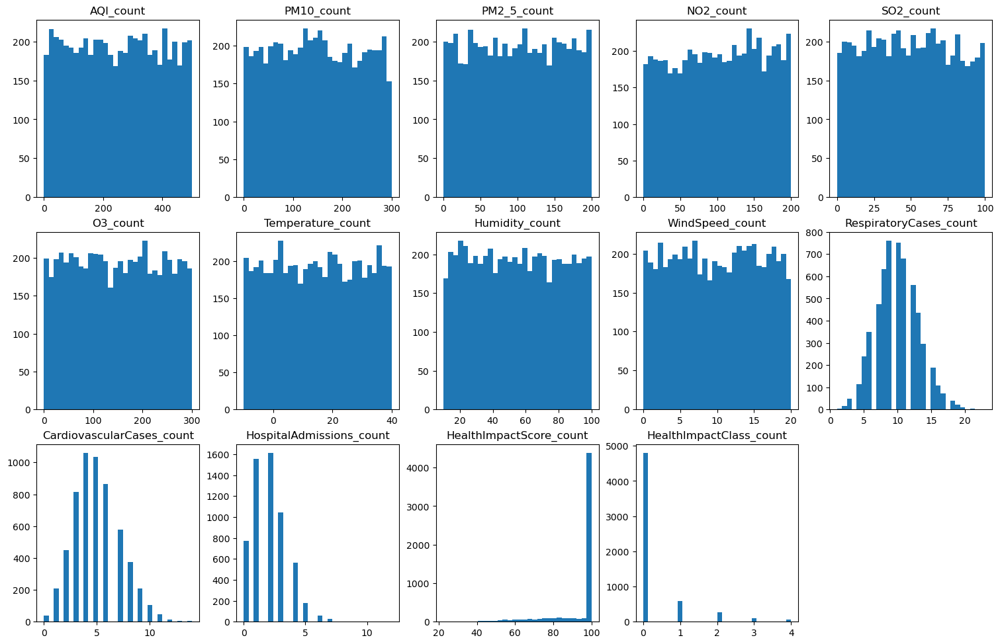

In [166]:
col_count=['AQI','PM10','PM2_5','NO2','SO2','O3','Temperature','Humidity','WindSpeed','RespiratoryCases',
           'CardiovascularCases','HospitalAdmissions','HealthImpactScore','HealthImpactClass']
plt.figure(figsize=(15,15),layout='constrained')
for i in range(len(col_count)):
    plt.subplot(5,5,i+1)                            
    plt.hist(a[col_count[i]],bins=30) 
    plt.title(col_count[i]+'_count')
plt.show()

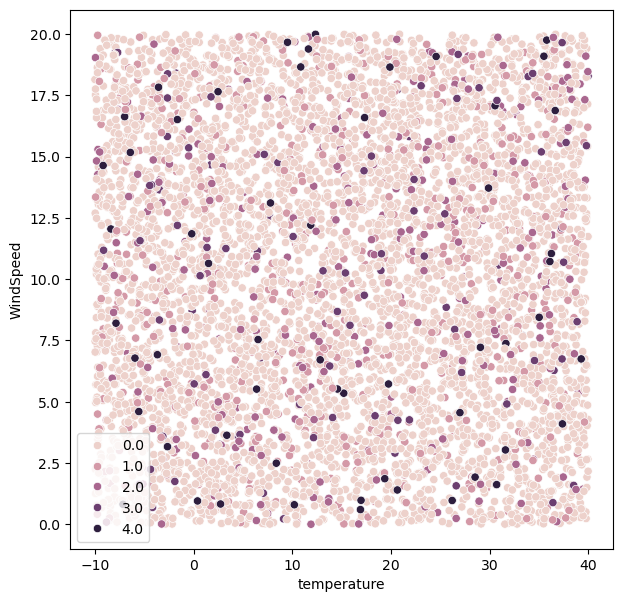

In [168]:
plt.figure(figsize=(7,7))
sns.scatterplot(data=a, x='Temperature', y='WindSpeed', hue='HealthImpactClass')
plt.xlabel('temperature')
plt.ylabel('WindSpeed')
plt.legend()       
plt.savefig('scatter plot of temperature vs windspeed by HealthImpactClass.png') 

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13],
 [Text(0, 0, 'AQI'),
  Text(1, 0, 'PM10'),
  Text(2, 0, 'PM2_5'),
  Text(3, 0, 'NO2'),
  Text(4, 0, 'SO2'),
  Text(5, 0, 'O3'),
  Text(6, 0, 'Temperature'),
  Text(7, 0, 'Humidity'),
  Text(8, 0, 'WindSpeed'),
  Text(9, 0, 'RespiratoryCases'),
  Text(10, 0, 'CardiovascularCases'),
  Text(11, 0, 'HospitalAdmissions'),
  Text(12, 0, 'HealthImpactScore'),
  Text(13, 0, 'HealthImpactClass')])

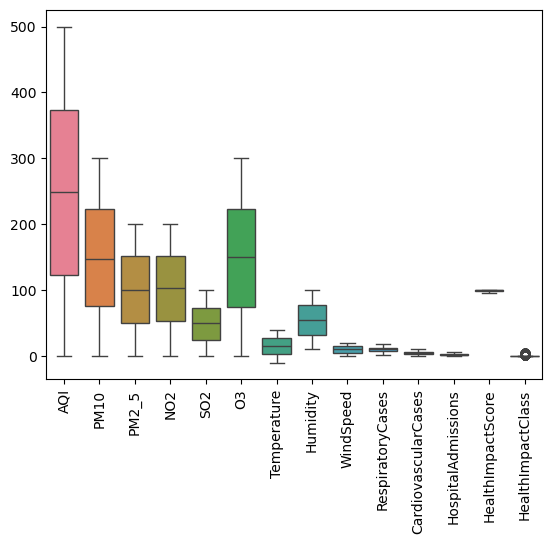

In [23]:
sns.boxplot(a) 
plt.xticks(rotation=90)

Text(0.5, 1.0, 'HealthImpactClass')

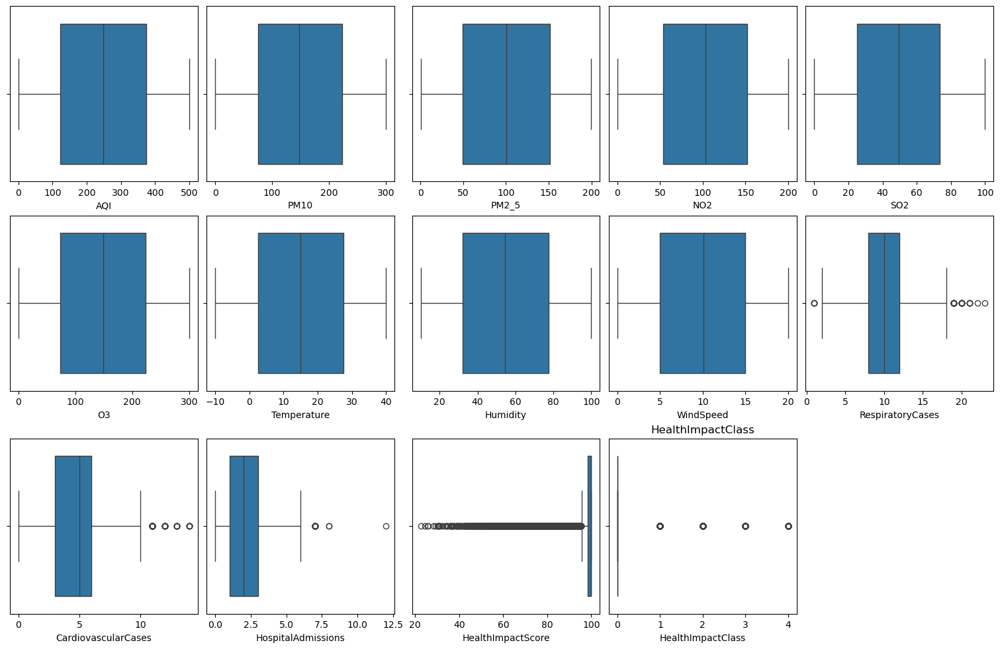

In [392]:
col=['AQI','PM10','PM2_5','NO2','SO2','O3','Temperature','Humidity','WindSpeed','RespiratoryCases','CardiovascularCases','HospitalAdmissions','HealthImpactScore','HealthImpactClass']
plt.figure(figsize=(15,15),layout='constrained')
for i in range(len(col)):
       plt.subplot(5,5,i+1)
       sns.boxplot(data=a,x=col[i])
     
plt.title(col[i])

### OUTLIER TREATING

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13],
 [Text(0, 0, 'AQI'),
  Text(1, 0, 'PM10'),
  Text(2, 0, 'PM2_5'),
  Text(3, 0, 'NO2'),
  Text(4, 0, 'SO2'),
  Text(5, 0, 'O3'),
  Text(6, 0, 'Temperature'),
  Text(7, 0, 'Humidity'),
  Text(8, 0, 'WindSpeed'),
  Text(9, 0, 'RespiratoryCases'),
  Text(10, 0, 'CardiovascularCases'),
  Text(11, 0, 'HospitalAdmissions'),
  Text(12, 0, 'HealthImpactScore'),
  Text(13, 0, 'HealthImpactClass')])

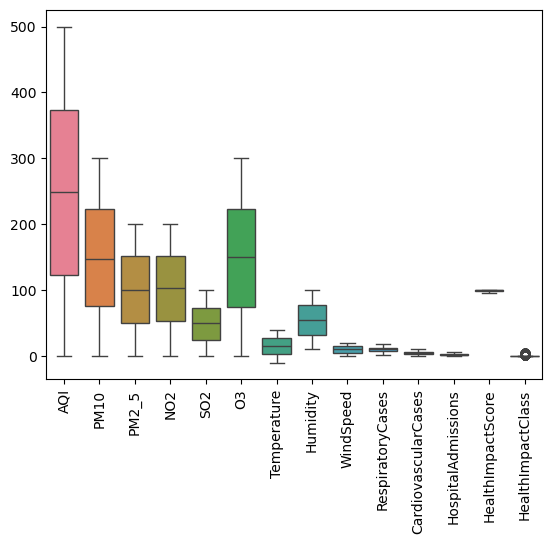

In [170]:
list=["RespiratoryCases","CardiovascularCases","HospitalAdmissions","HealthImpactScore"]
for i in list:
    Q1=a[i].quantile(0.25)                                 
    Q3=a[i].quantile(0.75)
    IQR=Q3-Q1
    lower_limit=Q1-1.5*IQR
    upper_limit=Q3+1.5*IQR                                 
    a.loc[(a[i]>=upper_limit),i]=upper_limit               
    a.loc[(a[i]<=lower_limit),i]=lower_limit
sns.boxplot(a) 
plt.xticks(rotation=90)

In [172]:
a.corr()   

,AQI,PM10,PM2_5,NO2,SO2,O3,Temperature,Humidity,WindSpeed,RespiratoryCases,CardiovascularCases,HospitalAdmissions,HealthImpactScore,HealthImpactClass
AQI,1.000000,0.023127,0.005890,0.007836,-0.006644,0.002339,0.004185,-0.004217,-0.018816,0.009126,0.009826,-0.014358,0.701262,-0.348106
PM10,0.023127,1.000000,-0.012193,0.008487,-0.007177,-0.004411,-0.017561,-0.017290,-0.018959,-0.001452,0.016272,-0.008733,0.151725,-0.108271
PM2_5,0.005890,-0.012193,1.000000,0.005564,0.015894,0.006070,-0.001978,0.006720,0.009041,0.024766,0.018630,-0.024591,0.165192,-0.152407
NO2,0.007836,0.008487,0.005564,1.000000,-0.019979,-0.014910,0.006971,-0.011100,-0.001398,0.019041,-0.005480,-0.002823,0.095900,-0.090387
SO2,-0.006644,-0.007177,0.015894,-0.019979,1.000000,-0.004319,-0.022458,0.000910,-0.001617,0.010236,-0.004340,-0.008994,0.008168,-0.008364
O3,0.002339,-0.004411,0.006070,-0.014910,-0.004319,1.000000,-0.001257,0.003982,-0.002596,-0.009010,0.002785,-0.012502,0.132416,-0.110093
Temperature,0.004185,-0.017561,-0.001978,0.006971,-0.022458,-0.001257,1.000000,-0.000233,0.000887,0.009143,0.008655,0.008279,-0.015589,0.005969
Humidity,-0.004217,-0.017290,0.006720,-0.011100,0.000910,0.003982,-0.000233,1.000000,0.021027,0.008886,-0.024499,-0.006807,-0.005602,-0.006715
WindSpeed,-0.018816,-0.018959,0.009041,-0.001398,-0.001617,-0.002596,0.000887,0.021027,1.000000,-0.010631,0.003416,-0.005968,-0.028212,0.005999
RespiratoryCases,0.009126,-0.001452,0.024766,0.019041,0.010236,-0.009010,0.009143,0.008886,-0.010631,1.000000,-0.003895,0.009010,0.014031,-0.008719


<Axes: >

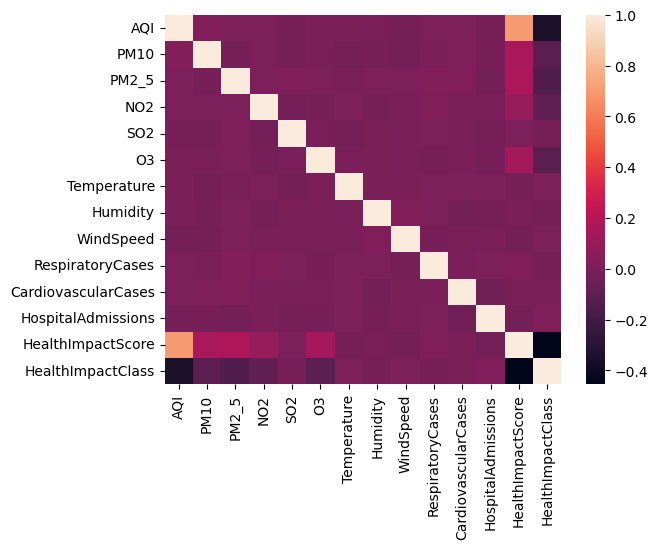

In [174]:
sns.heatmap(a.corr())

### SPLITTING THE DATA

In [176]:
x=a.drop(['HealthImpactClass'],axis=1)
y=a['HealthImpactClass']
print(x)
print(y)

             AQI        PM10       PM2_5         NO2        SO2          O3  \
0     187.270059  295.853039   13.038560    6.639263  66.161150   54.624280   
1     475.357153  246.254703    9.984497   16.318326  90.499523  169.621728   
2     365.996971   84.443191   23.111340   96.317811  17.875850    9.006794   
3     299.329242   21.020609   14.273403   81.234403  48.323616   93.161033   
4      78.009320   16.987667  152.111623  121.235461  90.866167  241.795138   
...          ...         ...         ...         ...        ...         ...   
5806  171.112762   11.246387  197.984628  158.643107  17.743678  280.370909   
5807  490.691667  275.340762   55.774170  132.336871  29.334724  108.043492   
5808  314.841798   41.892699  184.708551   82.105823  68.334578  105.568503   
5809  208.080473  165.533785  199.177255  100.796385  87.586488  166.469537   
5810   83.269257   82.216262  119.968244  193.440691  79.849177   28.681885   

      Temperature   Humidity  WindSpeed  Respirator

In [178]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=40) 

In [180]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler() 
x_train=scaler.fit_transform(x_train)
x_test=scaler.transform(x_test)

### LOGISTIC REGRESSION

In [415]:
log=LogisticRegression() 
log.fit(x_train,y_train) 
y_pred_test=log.predict(x_test)    
y_pred_train=log.predict(x_train)

In [417]:
print('test_acc:',log.score(x_test,y_test))
print('train_acc:',log.score(x_train,y_train))
cm=confusion_matrix(y_test,y_pred_test)
print(cm)
print('CR:',classification_report(y_test,y_pred_test))

test_acc: 0.8721330275229358
train_acc: 0.8868945168428818
[[1419   14    0    0    0]
 [  92   81   11    0    0]
 [  16   37   21    0    0]
 [  17    4   12    0    0]
 [  17    3    0    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.91      0.99      0.95      1433
         1.0       0.58      0.44      0.50       184
         2.0       0.48      0.28      0.36        74
         3.0       0.00      0.00      0.00        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.87      1744
   macro avg       0.39      0.34      0.36      1744
weighted avg       0.83      0.87      0.85      1744



In [421]:
log_acc=accuracy_score(y_test,y_pred_test)*100
print("accuracy_score:",log_acc) 

accuracy_score: 87.21330275229357


### DECISION TREE

In [425]:

dt=DecisionTreeClassifier(max_depth=9)
dt.fit(x_train,y_train)
y_pred_test=dt.predict(x_test)
y_pred_train=dt.predict(x_train) 

In [427]:
print('test_acc:',dt.score(x_test,y_test))
print('train_acc:',dt.score(x_train,y_train))
cm=confusion_matrix(y_test,y_pred_test)
print(cm)
print('CR:',classification_report(y_test,y_pred_test))

test_acc: 0.8560779816513762
train_acc: 0.9518072289156626
[[1365   53    5    3    7]
 [  68   89   26    0    1]
 [  18   22   34    0    0]
 [  17    3    8    5    0]
 [  14    4    2    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.92      0.95      0.94      1433
         1.0       0.52      0.48      0.50       184
         2.0       0.45      0.46      0.46        74
         3.0       0.62      0.15      0.24        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.86      1744
   macro avg       0.50      0.41      0.43      1744
weighted avg       0.84      0.86      0.85      1744



In [429]:
dt_acc=accuracy_score(y_test,y_predd)*100
print("accuracy score:",dt_acc) 

accuracy score: 85.72247706422019


### RANDOM FOREST

In [431]:
rf=RandomForestClassifier(n_estimators=50,random_state=20)
rf.fit(x_train,y_train)
y_pred_test=rf.predict(x_test)
y_pred_train=rf.predict(x_train)

In [432]:
print('test_acc:',rf.score(x_test,y_test))
print('train_acc:',rf.score(x_train,y_train))
cm=confusion_matrix(y_test,y_pred_test)
print(cm)
print('CR:',classification_report(y_test,y_pred_test))

test_acc: 0.8922018348623854
train_acc: 0.9992623555446275
[[1407   25    1    0    0]
 [  63  117    4    0    0]
 [  14   30   30    0    0]
 [  16    4   11    2    0]
 [  16    3    1    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.93      0.98      0.95      1433
         1.0       0.65      0.64      0.64       184
         2.0       0.64      0.41      0.50        74
         3.0       1.00      0.06      0.11        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.89      1744
   macro avg       0.64      0.42      0.44      1744
weighted avg       0.88      0.89      0.88      1744



In [435]:
rf_acc=accuracy_score(y_test,y_pred_test)*100
print("accuracy score:",rf_acc)

accuracy score: 89.22018348623854


### ADABOOST

In [639]:
adb=AdaBoostClassifier(n_estimators=100,learning_rate=0.2,random_state=25)
adb.fit(x_train,y_train)
y_pred_test=adb.predict(x_test)
y_pred_train=adb.predict(x_train)

In [641]:
print('test_acc:',adb.score(x_test,y_test))
print('train_acc:',adb.score(x_train,y_train))
cm=confusion_matrix(y_test,y_pred_test)
print(cm)
print('CR:',classification_report(y_test,y_pred_test))

test_acc: 0.8440366972477065
train_acc: 0.8618146053602164
[[1394   39    0    0    0]
 [ 107   76    1    0    0]
 [  30   42    2    0    0]
 [  19   13    1    0    0]
 [  17    3    0    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.89      0.97      0.93      1433
         1.0       0.44      0.41      0.43       184
         2.0       0.50      0.03      0.05        74
         3.0       0.00      0.00      0.00        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.84      1744
   macro avg       0.37      0.28      0.28      1744
weighted avg       0.80      0.84      0.81      1744



In [441]:
adb_acc=accuracy_score(y_test,y_pred)*100
print("accuracy score:",adb_acc)

accuracy score: 90.48165137614679


### GRADIENT BOOST

In [443]:
gbc=GradientBoostingClassifier(n_estimators=50,learning_rate=0.05,random_state=5)        
gbc.fit(x_train,y_train)
y_pred_test=gbc.predict(x_test)
y_pred_train=gbc.predict(x_train)

In [444]:
print('test_acc:',gbc.score(x_test,y_test))
print('train_acc:',gbc.score(x_train,y_train))
print('CR:',classification_report(y_test,y_pred_test))
cm=confusion_matrix(y_test,y_pred_test)
print(cm)

test_acc: 0.8744266055045872
train_acc: 0.9267273174329973
CR:               precision    recall  f1-score   support

         0.0       0.92      0.97      0.94      1433
         1.0       0.62      0.55      0.58       184
         2.0       0.54      0.43      0.48        74
         3.0       0.40      0.06      0.11        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.87      1744
   macro avg       0.50      0.40      0.42      1744
weighted avg       0.85      0.87      0.86      1744

[[1390   33    3    2    5]
 [  70  101   12    0    1]
 [  15   25   32    1    1]
 [  18    1   11    2    1]
 [  17    2    1    0    0]]


In [449]:
gbc_acc=accuracy_score(y_test,y_preds)*100
print("accuracy score:",gbc_acc)

accuracy score: 81.65137614678899


### XG BOOST

In [451]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [452]:
from xgboost import XGBClassifier
xgb=XGBClassifier()
xgb.fit(x_train,y_train)
y_pred_test=xgb.predict(x_test)
y_pred_train=xgb.predict(x_train)

In [455]:
print('test_acc:',xgb.score(x_test,y_test))
print('train_acc:',xgb.score(x_train,y_train))
print('CR:',classification_report(y_test,y_pred_test))
cm=confusion_matrix(y_test,y_pred_test)
print(cm)

test_acc: 0.9036697247706422
train_acc: 1.0
CR:               precision    recall  f1-score   support

         0.0       0.94      0.98      0.96      1433
         1.0       0.70      0.70      0.70       184
         2.0       0.64      0.49      0.55        74
         3.0       1.00      0.09      0.17        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.90      1744
   macro avg       0.66      0.45      0.48      1744
weighted avg       0.89      0.90      0.89      1744

[[1408   24    1    0    0]
 [  46  129    9    0    0]
 [  14   24   36    0    0]
 [  16    4    9    3    1]
 [  17    2    1    0    0]]


In [457]:
xgb_acc=accuracy_score(y_test,y_preds)*100
print("accuracy score:",xgb_acc)

accuracy score: 81.65137614678899


### K NEAREST NEIGHBOR(KNN)

In [459]:
knn=KNeighborsClassifier(n_neighbors=3)
knn.fit(x_train,y_train)
y_pred_test=knn.predict(x_test)
y_pred_train=knn.predict(x_train)

In [461]:
print('test_acc:',knn.score(x_test,y_test))
print('train_acc:',knn.score(x_train,y_train))
cm=confusion_matrix(y_test,y_pred_test)
print(cm)
print('CR:',classification_report(y_test,y_pred_test))

test_acc: 0.8297018348623854
train_acc: 0.8977133021883452
[[1362   62    9    0    0]
 [  95   69   20    0    0]
 [  37   22   15    0    0]
 [  21    7    4    1    0]
 [  17    3    0    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.89      0.95      0.92      1433
         1.0       0.42      0.38      0.40       184
         2.0       0.31      0.20      0.25        74
         3.0       1.00      0.03      0.06        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.83      1744
   macro avg       0.52      0.31      0.32      1744
weighted avg       0.81      0.83      0.81      1744



In [463]:
knn_acc=accuracy_score(y_test,y_pred)*100
print('accuracy score:',knn_acc)

accuracy score: 90.48165137614679


### SUPPORT VECTOR MACHINE

In [465]:
from sklearn.svm import SVC
svc=SVC(kernel="linear")
svc.fit(x_train,y_train)
y_pred_test=svc.predict(x_test)
y_pred_train=svc.predict(x_train)
print('test_acc',svc.score(x_test,y_test))
print('train_acc:',svc.score(x_train,y_train))
print('CM:',confusion_matrix(y_test,y_pred_test))
print('CR:',classification_report(y_test,y_pred_test))
svc_acc=accuracy_score(y_test,y_pred_test)*100
print("accuracy score:",svc_acc)

test_acc 0.919151376146789
train_acc: 0.9264814359478731
CM: [[1430    2    1    0    0]
 [  35  144    5    0    0]
 [  14   31   29    0    0]
 [  16    3   14    0    0]
 [  17    3    0    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.95      1.00      0.97      1433
         1.0       0.79      0.78      0.78       184
         2.0       0.59      0.39      0.47        74
         3.0       0.00      0.00      0.00        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.92      1744
   macro avg       0.46      0.43      0.45      1744
weighted avg       0.89      0.92      0.90      1744

accuracy score: 91.9151376146789


In [467]:
poly=SVC(kernel="poly",degree=3,gamma=15,C=200)
poly.fit(x_train,y_train)
y_pred_test=poly.predict(x_test)
y_pred_train=poly.predict(x_train)
print('test_acc',poly.score(x_test,y_test))
print('test_acc:',poly.score(x_train,y_train))
print('CM:',confusion_matrix(y_test,y_pred_test))
print('CR:',classification_report(y_test,y_pred_test))
pa_acc=accuracy_score(y_test,y_pred_test)*100
print("accuracy score:",pa_acc)

test_acc 0.8400229357798165
test_acc: 1.0
CM: [[1326   64   19   13   11]
 [  60  106   15    2    1]
 [  18   22   28    5    1]
 [  16    5    8    4    0]
 [  17    0    2    0    1]]
CR:               precision    recall  f1-score   support

         0.0       0.92      0.93      0.92      1433
         1.0       0.54      0.58      0.56       184
         2.0       0.39      0.38      0.38        74
         3.0       0.17      0.12      0.14        33
         4.0       0.07      0.05      0.06        20

    accuracy                           0.84      1744
   macro avg       0.42      0.41      0.41      1744
weighted avg       0.84      0.84      0.84      1744

accuracy score: 84.00229357798165


In [468]:
model2=SVC(kernel="sigmoid",gamma=10,C=5)
model2.fit(x_train,y_train)
y_pred=model2.predict(x_test)
y_pred1=model2.predict(x_train)
print('test_acc',model2.score(x_test,y_test))
print('test_acc:',model2.score(x_train,y_train))
print('CM:',confusion_matrix(y_test,y_pred))
print('CR:',classification_report(y_test,y_pred))
sca=accuracy_score(y_test,y_pred)*100
print("accuracy score:",sca)

test_acc 0.8216743119266054
test_acc: 0.8298500122940743
CM: [[1433    0    0    0    0]
 [ 184    0    0    0    0]
 [  74    0    0    0    0]
 [  33    0    0    0    0]
 [  20    0    0    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.82      1.00      0.90      1433
         1.0       0.00      0.00      0.00       184
         2.0       0.00      0.00      0.00        74
         3.0       0.00      0.00      0.00        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.82      1744
   macro avg       0.16      0.20      0.18      1744
weighted avg       0.68      0.82      0.74      1744

accuracy score: 82.16743119266054


In [470]:
rbf=SVC()
rbf.fit(x_train,y_train)
y_pred=rbf.predict(x_test)
print('Test accuracy:',rbf.score(x_test,y_test))
print('train accuracy:',rbf.score(x_train,y_train))
print('CM:',confusion_matrix(y_test,y_pred))
print('CR:',classification_report(y_test,y_pred))
ra=accuracy_score(y_test,y_pred)*100
print("accuracy score:",ra)


Test accuracy: 0.9048165137614679
train accuracy: 0.9358249323825916
CM: [[1415   18    0    0    0]
 [  48  128    8    0    0]
 [  14   25   35    0    0]
 [  17    2   14    0    0]
 [  17    2    1    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.94      0.99      0.96      1433
         1.0       0.73      0.70      0.71       184
         2.0       0.60      0.47      0.53        74
         3.0       0.00      0.00      0.00        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.90      1744
   macro avg       0.45      0.43      0.44      1744
weighted avg       0.87      0.90      0.89      1744

accuracy score: 90.48165137614679


### NAIVE BAYES (GaussianNB)

In [474]:
from sklearn.naive_bayes import GaussianNB
gb=GaussianNB()
gb.fit(x_train,y_train)
y_preds=gb.predict(x_test)
print('Test accuracy:',gb.score(x_test,y_test))
print('train accuracy:',gb.score(x_train,y_train))
cm=confusion_matrix(y_test,y_preds)
print(cm)
print('CR:',classification_report(y_test,y_preds))
nb_acc=accuracy_score(y_test,y_preds)*100
print("accuracy score:",nb_acc)

Test accuracy: 0.8165137614678899
train accuracy: 0.8209982788296041
[[1257  172    4    0    0]
 [  14  167    3    0    0]
 [  13   61    0    0    0]
 [  15   17    1    0    0]
 [  11    9    0    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.96      0.88      0.92      1433
         1.0       0.39      0.91      0.55       184
         2.0       0.00      0.00      0.00        74
         3.0       0.00      0.00      0.00        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.82      1744
   macro avg       0.27      0.36      0.29      1744
weighted avg       0.83      0.82      0.81      1744

accuracy score: 81.65137614678899


### ACCURACY OF MODELS

In [476]:
tb=pd.DataFrame()
tb['model']=pd.Series(['knn','log','gb','rf','adb','gbc','dt','svc','xgb'])
tb['accuracy']=pd.Series([knn_acc,log_acc,nb_acc,rf_acc,adb_acc,gbc_acc,dt_acc,svc_acc,xgb_acc])
tb

,model,accuracy
0,knn,90.481651
1,log,87.213303
2,gb,81.651376
3,rf,89.220183
4,adb,90.481651
5,gbc,81.651376
6,dt,85.722477
7,svc,91.915138
8,xgb,81.651376


### OVER SAMPLING

In [478]:
a.value_counts('HealthImpactClass')

HealthImpactClass
0.0    4808
1.0     579
2.0     273
3.0      95
4.0      56
Name: count, dtype: int64

In [480]:
from imblearn.over_sampling import SMOTE      
over=SMOTE(random_state=5)
x_ov,y_ov=over.fit_resample(x,y)
y_ov.value_counts() 

HealthImpactClass
0.0    4808
1.0    4808
3.0    4808
2.0    4808
4.0    4808
Name: count, dtype: int64

In [484]:
knn=KNeighborsClassifier(n_neighbors=3)
knn.fit(x_train,y_train)
y_pred_test=knn.predict(x_test)
print('Test accuracy:',knn.score(x_test,y_test))
print('train accuracy:',knn.score(x_train,y_train))
cm=confusion_matrix(y_test,y_pred_test)
print(cm)
print('CR:',classification_report(y_test,y_pred_test))
knno=accuracy_score(y_test,y_pred)*100
print('accuracy score',knno)

Test accuracy: 0.8297018348623854
train accuracy: 0.8977133021883452
[[1362   62    9    0    0]
 [  95   69   20    0    0]
 [  37   22   15    0    0]
 [  21    7    4    1    0]
 [  17    3    0    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.89      0.95      0.92      1433
         1.0       0.42      0.38      0.40       184
         2.0       0.31      0.20      0.25        74
         3.0       1.00      0.03      0.06        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.83      1744
   macro avg       0.52      0.31      0.32      1744
weighted avg       0.81      0.83      0.81      1744

accuracy score 90.48165137614679


In [486]:
lr=LogisticRegression()
lr.fit(x_train,y_train)
y_pred_test=lr.predict(x_test)
print('Test accuracy:',lr.score(x_test,y_test))
print('train accuracy:',lr.score(x_train,y_train))
cm=confusion_matrix(y_test,y_pred_test)
print(cm)
print('CR:',classification_report(y_test,y_pred_test))
lro=accuracy_score(y_test,y_pred_test)*100
print('accuracy score',lro)

Test accuracy: 0.8721330275229358
train accuracy: 0.8868945168428818
[[1419   14    0    0    0]
 [  92   81   11    0    0]
 [  16   37   21    0    0]
 [  17    4   12    0    0]
 [  17    3    0    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.91      0.99      0.95      1433
         1.0       0.58      0.44      0.50       184
         2.0       0.48      0.28      0.36        74
         3.0       0.00      0.00      0.00        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.87      1744
   macro avg       0.39      0.34      0.36      1744
weighted avg       0.83      0.87      0.85      1744

accuracy score 87.21330275229357


In [490]:
gb=GaussianNB()
gb.fit(x_train,y_train)
y_preds=gb.predict(x_test)
print('Test accuracy:',gb.score(x_test,y_test))
print('train accuracy:',gb.score(x_train,y_train))
cm=confusion_matrix(y_test,y_preds)
print(cm)
print('CR:',classification_report(y_test,y_preds))
nbo=accuracy_score(y_test,y_preds)*100
print('accuracy score',nbo)

Test accuracy: 0.8165137614678899
train accuracy: 0.8209982788296041
[[1257  172    4    0    0]
 [  14  167    3    0    0]
 [  13   61    0    0    0]
 [  15   17    1    0    0]
 [  11    9    0    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.96      0.88      0.92      1433
         1.0       0.39      0.91      0.55       184
         2.0       0.00      0.00      0.00        74
         3.0       0.00      0.00      0.00        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.82      1744
   macro avg       0.27      0.36      0.29      1744
weighted avg       0.83      0.82      0.81      1744

accuracy score 81.65137614678899


In [492]:
rf=RandomForestClassifier(n_estimators=5,random_state=10)
rf.fit(x_train,y_train)
y_pred1=rf.predict(x_test)
print('Test accuracy:',rf.score(x_test,y_test))
print('train accuracy:',rf.score(x_train,y_train))
cm=confusion_matrix(y_test,y_pred1)
print(cm)
print('CR:',classification_report(y_test,y_pred1))
rfo=accuracy_score(y_test,y_pred1)*100
print('accuracy score',rfo)

Test accuracy: 0.8600917431192661
train accuracy: 0.9832800590115565
[[1383   45    3    0    2]
 [  74   94   16    0    0]
 [  16   35   23    0    0]
 [  18    4   11    0    0]
 [  18    1    1    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.92      0.97      0.94      1433
         1.0       0.53      0.51      0.52       184
         2.0       0.43      0.31      0.36        74
         3.0       0.00      0.00      0.00        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.86      1744
   macro avg       0.37      0.36      0.36      1744
weighted avg       0.83      0.86      0.84      1744

accuracy score 86.0091743119266


In [496]:

adb=AdaBoostClassifier(n_estimators=10,estimator=None,learning_rate=0.2,random_state=5)
adb.fit(x_train,y_train)
y_preds=adb.predict(x_test)
print('Test accuracy:',adb.score(x_test,y_test))
print('train accuracy:',adb.score(x_train,y_train))
cm=confusion_matrix(y_test,y_preds)
print(cm)
print('CR:',classification_report(y_test,y_preds))
adbo=accuracy_score(y_test,y_preds)*100
print('accuracy score',adbo)

Test accuracy: 0.8423165137614679
train accuracy: 0.8537005163511188
[[1405   28    0    0    0]
 [ 120   64    0    0    0]
 [  38   36    0    0    0]
 [  19   14    0    0    0]
 [  18    2    0    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.88      0.98      0.93      1433
         1.0       0.44      0.35      0.39       184
         2.0       0.00      0.00      0.00        74
         3.0       0.00      0.00      0.00        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.84      1744
   macro avg       0.26      0.27      0.26      1744
weighted avg       0.77      0.84      0.80      1744

accuracy score 84.23165137614679


In [500]:
gbc=GradientBoostingClassifier(n_estimators=100,learning_rate=0.05,random_state=200)
gbc.fit(x_train,y_train)
y_preds=gbc.predict(x_test)
print('Test accuracy:',gbc.score(x_test,y_test))
print('train accuracy:',gbc.score(x_train,y_train))
cm=confusion_matrix(y_test,y_preds)
print(cm)
print('CR:',classification_report(y_test,y_preds))
gbco=accuracy_score(y_test,y_preds)*100
print('accuracy score',gbco)

Test accuracy: 0.8836009174311926
train accuracy: 0.9471354806983034
[[1394   26    2    6    5]
 [  58  113   10    2    1]
 [  15   24   32    2    1]
 [  18    1   11    2    1]
 [  17    2    1    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.93      0.97      0.95      1433
         1.0       0.68      0.61      0.65       184
         2.0       0.57      0.43      0.49        74
         3.0       0.17      0.06      0.09        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.88      1744
   macro avg       0.47      0.42      0.44      1744
weighted avg       0.86      0.88      0.87      1744

accuracy score 88.36009174311926


In [506]:
xg=XGBClassifier()
xg.fit(x_train,y_train)
y_predd=xg.predict(x_test)
print('Test accuracy:',xg.score(x_test,y_test))
print('train accuracy:',xg.score(x_train,y_train))
cm=confusion_matrix(y_test,y_predd)
print(cm)
print('CR:',classification_report(y_test,y_predd))
xgo=accuracy_score(y_test,y_predd)*100
print("accuracy score:",xgo)

Test accuracy: 0.9036697247706422
train accuracy: 1.0
[[1408   24    1    0    0]
 [  46  129    9    0    0]
 [  14   24   36    0    0]
 [  16    4    9    3    1]
 [  17    2    1    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.94      0.98      0.96      1433
         1.0       0.70      0.70      0.70       184
         2.0       0.64      0.49      0.55        74
         3.0       1.00      0.09      0.17        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.90      1744
   macro avg       0.66      0.45      0.48      1744
weighted avg       0.89      0.90      0.89      1744

accuracy score: 90.36697247706422


In [508]:
dt=DecisionTreeClassifier(criterion='entropy')
dt.fit(x_train,y_train)
y_preds=dt.predict(x_test)
print('Test accuracy:',dt.score(x_test,y_test))
print('train accuracy:',dt.score(x_train,y_train))
cm=confusion_matrix(y_test,y_preds)
print(cm)
print('CR:',classification_report(y_test,y_preds))
dto=accuracy_score(y_test,y_preds)*100
print('accuracy score',dto)

Test accuracy: 0.8285550458715596
train accuracy: 1.0
[[1308   70   20   17   18]
 [  58   98   24    2    2]
 [  13   23   35    2    1]
 [  15    5    8    4    1]
 [  15    4    1    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.93      0.91      0.92      1433
         1.0       0.49      0.53      0.51       184
         2.0       0.40      0.47      0.43        74
         3.0       0.16      0.12      0.14        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.83      1744
   macro avg       0.40      0.41      0.40      1744
weighted avg       0.83      0.83      0.83      1744

accuracy score 82.85550458715596


In [510]:
svc=SVC(kernel="linear")
svc.fit(x_train,y_train)
y_pred=svc.predict(x_test)
print('Test accuracy:',svc.score(x_test,y_test))
print('train accuracy:',svc.score(x_train,y_train))
cm=confusion_matrix(y_test,y_pred)
print(cm)
print('CR:',classification_report(y_test,y_pred))
so=accuracy_score(y_test,y_pred)*100
print("accuracy score:",so)

Test accuracy: 0.919151376146789
train accuracy: 0.9264814359478731
[[1430    2    1    0    0]
 [  35  144    5    0    0]
 [  14   31   29    0    0]
 [  16    3   14    0    0]
 [  17    3    0    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.95      1.00      0.97      1433
         1.0       0.79      0.78      0.78       184
         2.0       0.59      0.39      0.47        74
         3.0       0.00      0.00      0.00        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.92      1744
   macro avg       0.46      0.43      0.45      1744
weighted avg       0.89      0.92      0.90      1744

accuracy score: 91.9151376146789


In [512]:
poly=SVC(kernel="poly",degree=3,gamma=15,C=200)
poly.fit(x_train,y_train)
y_pred1=poly.predict(x_test)
print('Test accuracy:',poly.score(x_test,y_test))
print('train accuracy:',poly.score(x_train,y_train))
cm=confusion_matrix(y_test,y_pred1)
print(cm)
print('CR:',classification_report(y_test,y_pred1))
po=accuracy_score(y_test,y_pred1)*100
print("accuracy score:",po)

Test accuracy: 0.8400229357798165
train accuracy: 1.0
[[1326   64   19   13   11]
 [  60  106   15    2    1]
 [  18   22   28    5    1]
 [  16    5    8    4    0]
 [  17    0    2    0    1]]
CR:               precision    recall  f1-score   support

         0.0       0.92      0.93      0.92      1433
         1.0       0.54      0.58      0.56       184
         2.0       0.39      0.38      0.38        74
         3.0       0.17      0.12      0.14        33
         4.0       0.07      0.05      0.06        20

    accuracy                           0.84      1744
   macro avg       0.42      0.41      0.41      1744
weighted avg       0.84      0.84      0.84      1744

accuracy score: 84.00229357798165


In [514]:
model2=SVC(kernel="sigmoid",gamma=10,C=5)
model2.fit(x_train,y_train)
y_pred2=model2.predict(x_test)
print('Test accuracy:',model2.score(x_test,y_test))
print('train accuracy:',model2.score(x_train,y_train))
cm=confusion_matrix(y_test,y_pred2)
print(cm)
print('CR:',classification_report(y_test,y_pred2))
sco=accuracy_score(y_test,y_pred2)*100
print("accuracy score:",sco)

Test accuracy: 0.8216743119266054
train accuracy: 0.8298500122940743
[[1433    0    0    0    0]
 [ 184    0    0    0    0]
 [  74    0    0    0    0]
 [  33    0    0    0    0]
 [  20    0    0    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.82      1.00      0.90      1433
         1.0       0.00      0.00      0.00       184
         2.0       0.00      0.00      0.00        74
         3.0       0.00      0.00      0.00        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.82      1744
   macro avg       0.16      0.20      0.18      1744
weighted avg       0.68      0.82      0.74      1744

accuracy score: 82.16743119266054


In [516]:
rbf=SVC()
rbf.fit(x_train,y_train)
y_pred3=rbf.predict(x_test)
print('Test accuracy:',rbf.score(x_test,y_test))
print('train accuracy:',rbf.score(x_train,y_train))
c=confusion_matrix(y_test,y_pred3)
print(c)
print('CR:',classification_report(y_test,y_pred3))
ro=accuracy_score(y_test,y_pred3)*100
print("accuracy score:",ro)


Test accuracy: 0.9048165137614679
train accuracy: 0.9358249323825916
[[1415   18    0    0    0]
 [  48  128    8    0    0]
 [  14   25   35    0    0]
 [  17    2   14    0    0]
 [  17    2    1    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.94      0.99      0.96      1433
         1.0       0.73      0.70      0.71       184
         2.0       0.60      0.47      0.53        74
         3.0       0.00      0.00      0.00        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.90      1744
   macro avg       0.45      0.43      0.44      1744
weighted avg       0.87      0.90      0.89      1744

accuracy score: 90.48165137614679


### ACCURACY AFTER OVER SAMPLING

In [520]:
tb=pd.DataFrame()
tb['model']=pd.Series(['knn','log','gb','rf','adb','gbc','dt','svc','xgb'])
tb['accuracy']=pd.Series([knn_acc,log_acc,nb_acc,rf_acc,adb_acc,gbc_acc,dt_acc,svc_acc,xgb_acc])
tb['Accuracy_oversampling']=pd.Series([knno,lro,nbo,rfo,adbo,gbco,dto,so,xgo])
tb

,model,accuracy,Accuracy_oversampling
0,knn,90.481651,90.481651
1,log,87.213303,87.213303
2,gb,81.651376,81.651376
3,rf,89.220183,86.009174
4,adb,90.481651,84.231651
5,gbc,81.651376,88.360092
6,dt,85.722477,82.855505
7,svc,91.915138,91.915138
8,xgb,81.651376,90.366972


### HYPER PARAMETER TUNING

##### KNN

In [522]:
par={'n_neighbors':[3,5,27,59,11],'weights':['uniform','distance'],'algorithm':['auto','ball_tree','kd_tree']}
knt=GridSearchCV(knn,par,cv=10,scoring='accuracy')
knt.fit(x_train,y_train)
print(knt.best_params_)
print(knt.best_score_) 

{'algorithm': 'auto', 'n_neighbors': 59, 'weights': 'distance'}
0.849518282276903


In [524]:
knn=KNeighborsClassifier(n_neighbors=59,algorithm='auto',weights='distance')
knn.fit(x_train,y_train)

print('Test accuracy:',knn.score(x_test,y_test))
print('train accuracy:',knn.score(x_train,y_train))

y_pred_test=knn.predict(x_test)
y_pred_train=knn.predict(x_train)

knnt=accuracy_score(y_test,y_pred_test)*100
knntt=accuracy_score(y_train,y_pred_train)*100

print('accuracy score of test:',knnt)
print('accuracy score of train:',knntt)

Test accuracy: 0.8394495412844036
train accuracy: 1.0
accuracy score of test: 83.94495412844036
accuracy score of train: 100.0


In [526]:
cm=confusion_matrix(y_test,y_pred_test)
print(cm)
print('CR:',classification_report(y_test,y_pred_test))

[[1370   63    0    0    0]
 [  91   89    4    0    0]
 [  34   35    5    0    0]
 [  19    8    6    0    0]
 [  17    3    0    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.89      0.96      0.92      1433
         1.0       0.45      0.48      0.47       184
         2.0       0.33      0.07      0.11        74
         3.0       0.00      0.00      0.00        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.84      1744
   macro avg       0.34      0.30      0.30      1744
weighted avg       0.80      0.84      0.81      1744



##### LR

In [539]:
par={'C':[0.1,1,10,100],'penalty':['l1','l2'],'solver':['liblinear','lbfgs','saga']}
lrt=GridSearchCV(lr,par,cv=10,scoring='accuracy')
lrt.fit(x_train,y_train)
print(lrt.best_params_)
print(lrt.best_score_)

{'C': 100, 'penalty': 'l1', 'solver': 'saga'}
0.8932904467387225


In [553]:
log=LogisticRegression(C=100,penalty='l1',solver='saga')
log.fit(x_train,y_train)

print('Test accuracy:',log.score(x_test,y_test))
print('train accuracy:',log.score(x_train,y_train))

y_pred_test=log.predict(x_test)
y_pred_train=log.predict(x_train)


lrt=accuracy_score(y_test,y_pred_test)*100
lrtt=accuracy_score(y_train,y_pred_train)*100

print('accuracy score of test:',lrt)
print('accuracy score of train:',lrtt)

Test accuracy: 0.8847477064220184
train accuracy: 0.9014015244652077
accuracy score of test: 88.47477064220183
accuracy score of train: 90.14015244652077


In [555]:
cm=confusion_matrix(y_test,y_pred_test)
print(cm)
print('CR:',classification_report(y_test,y_pred_test))

[[1421   11    1    0    0]
 [  81   94    9    0    0]
 [  15   31   28    0    0]
 [  17    2   14    0    0]
 [  17    3    0    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.92      0.99      0.95      1433
         1.0       0.67      0.51      0.58       184
         2.0       0.54      0.38      0.44        74
         3.0       0.00      0.00      0.00        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.88      1744
   macro avg       0.42      0.38      0.40      1744
weighted avg       0.85      0.88      0.86      1744



##### NB

In [559]:
par={'var_smoothing':[1e-9,1e-8,1e-7]}
nbt=GridSearchCV(gb,par,cv=10,scoring='accuracy')
nbt.fit(x_train,y_train)
print(nbt.best_params_)
print(nbt.best_score_)

{'var_smoothing': 1e-09}
0.8207453310901587


In [561]:
gb=GaussianNB(var_smoothing=1e-09)
gb.fit(x_train,y_train)

print('Test accuracy:',gb.score(x_test,y_test))
print('train accuracy:',gb.score(x_train,y_train))

y_pred_test=gb.predict(x_test)
y_pred_train=gb.predict(x_train)

nbt=accuracy_score(y_test,y_pred_test)*100
nbtt=accuracy_score(y_train,y_pred_train)*100

print('accuracy score of test:',nbt)
print('accuracy score of train:',nbtt)

Test accuracy: 0.8165137614678899
train accuracy: 0.8209982788296041
accuracy score of test: 81.65137614678899
accuracy score of train: 82.09982788296041


In [563]:
cm=confusion_matrix(y_test,y_pred_test)
print(cm)
print('CR:',classification_report(y_test,y_pred_test))

[[1257  172    4    0    0]
 [  14  167    3    0    0]
 [  13   61    0    0    0]
 [  15   17    1    0    0]
 [  11    9    0    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.96      0.88      0.92      1433
         1.0       0.39      0.91      0.55       184
         2.0       0.00      0.00      0.00        74
         3.0       0.00      0.00      0.00        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.82      1744
   macro avg       0.27      0.36      0.29      1744
weighted avg       0.83      0.82      0.81      1744



##### RF

In [575]:
par={'max_depth':['None',10,20,30],'max_features':['auto','sqrt','log2']}
rft=GridSearchCV(rf,par,cv=10,scoring='accuracy')
rft.fit(x_train,y_train)                                            
print(rft.best_params_)
print(rft.best_score_)

{'max_depth': 30, 'max_features': 'sqrt'}
0.8991896733276044


In [577]:
rf=RandomForestClassifier(max_depth=30,max_features='sqrt')
rf.fit(x_train,y_train)

print('Test accuracy:',rf.score(x_test,y_test))
print('train accuracy:',rf.score(x_train,y_train))

y_pred_test=rf.predict(x_test)
y_pred_train=rf.predict(x_train)

rft=accuracy_score(y_test,y_pred_test)*100
rftt=accuracy_score(y_train,y_pred_train)*100

print('accuracy score of test:',rft)
print('accuracy score of train:',rftt)


Test accuracy: 0.8944954128440367
train accuracy: 0.9997541185148758
accuracy score of test: 89.44954128440367
accuracy score of train: 99.97541185148758


In [579]:
cm=confusion_matrix(y_test,y_pred_test)
print(cm)
print('CR:',classification_report(y_test,y_pred_test))

[[1404   28    1    0    0]
 [  55  124    5    0    0]
 [  15   27   32    0    0]
 [  16    4   13    0    0]
 [  16    4    0    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.93      0.98      0.96      1433
         1.0       0.66      0.67      0.67       184
         2.0       0.63      0.43      0.51        74
         3.0       0.00      0.00      0.00        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.89      1744
   macro avg       0.44      0.42      0.43      1744
weighted avg       0.86      0.89      0.88      1744



##### ADB

In [581]:
par={'n_estimators':[50,100,150],'learning_rate':[0.01,0.1,1.0]}
adt=GridSearchCV(adb,par,cv=10,scoring='accuracy')
adt.fit(x_train,y_train)
print(adt.best_params_)

{'learning_rate': 0.01, 'n_estimators': 100}


In [584]:
adb=AdaBoostClassifier(n_estimators=100,learning_rate=0.01)
adb.fit(x_train,y_train)

print('Test accuracy:',adb.score(x_test,y_test))
print('train accuracy:',adb.score(x_train,y_train))

y_pred_test=adb.predict(x_test)
y_pred_train=adb.predict(x_train)

adt=accuracy_score(y_test,y_pred_test)*100
adtt=accuracy_score(y_train,y_pred_train)*100

print('accuracy score of test:',adt)
print('accuracy score of train:',adtt)


Test accuracy: 0.8400229357798165
train accuracy: 0.8564052126874846
accuracy score of test: 84.00229357798165
accuracy score of train: 85.64052126874846


In [586]:
cm=confusion_matrix(y_test,y_pred_test)
print(cm)
print('CR:',classification_report(y_test,y_pred_test))

[[1353   80    0    0    0]
 [  72  112    0    0    0]
 [  17   57    0    0    0]
 [  19   14    0    0    0]
 [  14    6    0    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.92      0.94      0.93      1433
         1.0       0.42      0.61      0.49       184
         2.0       0.00      0.00      0.00        74
         3.0       0.00      0.00      0.00        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.84      1744
   macro avg       0.27      0.31      0.29      1744
weighted avg       0.80      0.84      0.82      1744



##### svm

In [588]:
gscv=GridSearchCV(svc,{"gamma":["auto","scale"],"C":[1,5,10,20],
                             "kernel":["linear","rbf","poly","sigmoid"]},
                  cv=5,return_train_score=True)
gscv.fit(x_train,y_train)
print(gscv.best_params_)
print(gscv.best_score_)

{'C': 20, 'gamma': 'auto', 'kernel': 'linear'}
0.9402510192178088


In [593]:
svc=SVC(C=20,gamma="auto",kernel="linear")
svc.fit(x_train,y_train)

print('Test accuracy:',svc.score(x_test,y_test))
print('train accuracy:',svc.score(x_train,y_train))

y_pred_test=svc.predict(x_test)
y_pred_train=svc.predict(x_train)

svct=accuracy_score(y_test,y_pred_test)*100
svctt=accuracy_score(y_train,y_pred_train)*100

print('accuracy score of test:',svct)
print('accuracy score of train:',svctt)



Test accuracy: 0.9346330275229358
train accuracy: 0.9419719695106958
accuracy score of test: 93.46330275229357
accuracy score of train: 94.19719695106959


In [595]:
c=confusion_matrix(y_test,y_pred_test)
print(c)
print('CR:',classification_report(y_test,y_pred_test))

[[1430    1    2    0    0]
 [  27  151    6    0    0]
 [  14   11   49    0    0]
 [  16    3   14    0    0]
 [  17    2    1    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.95      1.00      0.97      1433
         1.0       0.90      0.82      0.86       184
         2.0       0.68      0.66      0.67        74
         3.0       0.00      0.00      0.00        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.93      1744
   macro avg       0.51      0.50      0.50      1744
weighted avg       0.90      0.93      0.92      1744



##### GBC

In [615]:
par={'n_estimators':[100,200],'max_depth':[3,4,5]}
gbt=GridSearchCV(gbc,par,cv=10,scoring='accuracy')
gbt.fit(x_train,y_train)
print(gbt.best_params_)
print(gbt.best_score_)

{'max_depth': 5, 'n_estimators': 200}
0.8996762324348531


In [633]:
gbc=GradientBoostingClassifier(n_estimators=200,max_depth=5)
gbc.fit(x_train,y_train)

print('Test accuracy:',gbc.score(x_test,y_test))
print('train accuracy:',gbc.score(x_train,y_train))

y_pred_test=svc.predict(x_test)
y_pred_train=svc.predict(x_train)

gbt=accuracy_score(y_test,y_pred_test)*100
gbtt=accuracy_score(y_train,y_pred_train)*100

print('accuracy score of test:',gbt)
print('accuracy score of train:',gbtt)




Test accuracy: 0.8899082568807339
train accuracy: 1.0
accuracy score of test: 93.46330275229357
accuracy score of train: 94.19719695106959


In [635]:
cm=confusion_matrix(y_test,y_pred_test)
print(cm)
print('CR:',classification_report(y_test,y_pred_test))

[[1430    1    2    0    0]
 [  27  151    6    0    0]
 [  14   11   49    0    0]
 [  16    3   14    0    0]
 [  17    2    1    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.95      1.00      0.97      1433
         1.0       0.90      0.82      0.86       184
         2.0       0.68      0.66      0.67        74
         3.0       0.00      0.00      0.00        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.93      1744
   macro avg       0.51      0.50      0.50      1744
weighted avg       0.90      0.93      0.92      1744



<Axes: >

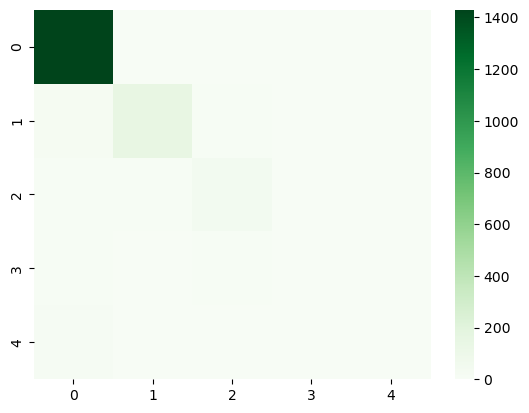

In [637]:
sns.heatmap(cm,cmap='Greens')

##### DT

In [598]:
par={'max_depth':[3,5,10],'criterion':['gini','entropy']}
dtt=GridSearchCV(dt,par,cv=10,scoring='accuracy')
dtt.fit(x_train,y_train)                                       
print(dtt.best_params_)

{'criterion': 'gini', 'max_depth': 5}


In [602]:
dt=DecisionTreeClassifier(criterion='gini',max_depth=5)
dt.fit(x_train,y_train)

print('Test accuracy:',dt.score(x_test,y_test))
print('train accuracy:',dt.score(x_train,y_train))

y_pred_test=dt.predict(x_test)
y_pred_train=dt.predict(x_train)


dtt=accuracy_score(y_test,y_pred_test)*100
dttt=accuracy_score(y_train,y_pred_train)*100

print('accuracy score of test:',dtt)
print('accuracy score of train:',dttt)

Test accuracy: 0.8543577981651376
train accuracy: 0.8895992131792476
accuracy score of test: 85.43577981651376
accuracy score of train: 88.95992131792477


In [604]:
c=confusion_matrix(y_test,y_pred_test)
print(c)
print('CR:',classification_report(y_test,y_pred_test))

[[1371   48    8    1    5]
 [  67   87   30    0    0]
 [  16   26   32    0    0]
 [  17    4   12    0    0]
 [  15    3    2    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.92      0.96      0.94      1433
         1.0       0.52      0.47      0.49       184
         2.0       0.38      0.43      0.41        74
         3.0       0.00      0.00      0.00        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.85      1744
   macro avg       0.36      0.37      0.37      1744
weighted avg       0.83      0.85      0.84      1744



##### XGB

In [607]:
param={"max_depth":[3,6,10],"learning_rate":[0.01,0.1,0.3],"n_estimators":[100,200],"subsample":[0.7,1],"colsample_bytree":[0.7,1]}
xgt=GridSearchCV(xg,param,cv=10,scoring="accuracy")         
xgt.fit(x_train,y_train)
print(xgt.best_params_)
print(xgt.best_score_) 

{'colsample_bytree': 1, 'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 100, 'subsample': 0.7}
0.9080427494220598


In [609]:
xg=XGBClassifier(max_depth=6,learning_rate=0.1,n_estimators=100,subsample=0.7,colsample_bytree=1)
xg.fit(x_train,y_train)

print('Test accuracy:',xg.score(x_test,y_test))
print('train accuracy:',xg.score(x_train,y_train))

y_pred_test=xg.predict(x_test)
y_pred_train=xg.predict(x_train)

xga=accuracy_score(y_test,y_pred_test)*100
xgat=accuracy_score(y_train,y_pred_train)*100

print('accuracy score of test:',xga)
print('accuracy score of train:',xgat)

Test accuracy: 0.9019495412844036
train accuracy: 0.9901647405950332
accuracy score of test: 90.19495412844036
accuracy score of train: 99.01647405950332


In [613]:
cm=confusion_matrix(y_test,y_pred_test)
print(cm)
print('CR:',classification_report(y_test,y_pred_test))

[[1409   23    1    0    0]
 [  46  130    8    0    0]
 [  14   28   32    0    0]
 [  17    4   10    2    0]
 [  17    2    1    0    0]]
CR:               precision    recall  f1-score   support

         0.0       0.94      0.98      0.96      1433
         1.0       0.70      0.71      0.70       184
         2.0       0.62      0.43      0.51        74
         3.0       1.00      0.06      0.11        33
         4.0       0.00      0.00      0.00        20

    accuracy                           0.90      1744
   macro avg       0.65      0.44      0.46      1744
weighted avg       0.89      0.90      0.89      1744



In [621]:
tb=pd.DataFrame()
tb['model']=pd.Series(['knn','log','gb','rf','adb','gbc','dt','xgb','svc'])
tb['accuracy']=pd.Series([knn_acc,log_acc,nb_acc,rf_acc,adb_acc,gbc_acc,dt_acc,xgb_acc,svc_acc])                                
tb['Accuracy_hyperparameter']=pd.Series([knnt,lrt,nbt,rft,adt,gbt,dtt,xga,svct])  
tb

,model,accuracy,Accuracy_hyperparameter
0,knn,90.481651,83.944954
1,log,87.213303,88.474771
2,gb,81.651376,81.651376
3,rf,89.220183,89.449541
4,adb,90.481651,84.002294
5,gbc,81.651376,93.463303
6,dt,85.722477,85.435780
7,xgb,81.651376,90.194954
8,svc,91.915138,93.463303


### TEST AND TRAIN ACCURACY

In [623]:
tb1=pd.DataFrame()
tb1['model']=pd.Series(['knn','log','gb','rf','adb','gbc','dt','xgb','svc'])
tb1['Test Accuracy']=pd.Series([knnt,lrt,nbt,rft,adt,gbt,dtt,xga,svct])
tb1['Train Accuracy']=pd.Series([knntt,lrtt,nbtt,rftt,adtt,gbtt,dttt,xgat,svctt])
tb1

,model,Test Accuracy,Train Accuracy
0,knn,83.944954,100.000000
1,log,88.474771,90.140152
2,gb,81.651376,82.099828
3,rf,89.449541,99.975412
4,adb,84.002294,85.640521
5,gbc,93.463303,94.197197
6,dt,85.435780,88.959921
7,xgb,90.194954,99.016474
8,svc,93.463303,94.197197


In [625]:
import joblib
joblib.dump(gbc,"C:/Users/PRO/model.pkl")

['C:/Users/PRO/model.pkl']

In [627]:
joblib.dump(scaler,"C:/Users/PRO/scaler.pkl")

['C:/Users/PRO/scaler.pkl']

In [629]:
v=[[183.345678,213.432178,12.563244,18.834567,16.623890,100.234567,9.34567,91.532468,15.423871,7,5,2,100.000000]]
gbc.predict(v)

array([3.])

In [631]:
def run_model():
    AQI=float(input('Enter the air quality index'))
    PM10=float(input('Enter the PM10'))
    PM2_5=float(input('Enter the PM2_5'))
    NO2=float(input('Enter the N02'))
    SO2=float(input('Enter the SO2'))
    O3=float(input('Enter the O3'))
    Temperature=float(input('Enter the Temperature'))
    Humidity=float(input('Enter the humidity'))
    WindSpeed=float(input('Enter the windspeed'))
    RespiratoryCases=int(input('Enter the Respiratory cases'))
    CardiovascularCases=int(input('Enter the cardiovascular cases'))
    HospitalAdmissions=int(input('Enter the Hospital Admissions'))
    HealthImpactScore=float(input('Enter the health impact score'))
    

   

    features = np.array([[AQI,PM10,PM2_5,NO2,SO2,O3,Temperature,Humidity,WindSpeed,RespiratoryCases,CardiovascularCases,HospitalAdmissions,HealthImpactScore]])
    Result =gbc.predict(features)
    print(Result)
    

    if Result == 0:
        print('The health impact is very high')
        print(""" 
              The very high health impact causes , Increased mortality rates, severe respiratory diseases, stricter environmental regulations, 
        and possible relocation from polluted areas
        """)

    elif Result == 1:
        print('The health impact is high')
        print("""
              Rising healthcare costs, increased cases of chronic illnesses, and stronger government policies to reduce pollution.  
              """)
              
    elif Result == 2:
        print('The health impact is moderate')
        print("""
        Noticeable health effects, with efforts toward pollution control and urban planning improvements
        """)

    elif Result == 3:
        print('The health impact is low')
        print("""
        Minor health concerns, but continued monitoring and preventive measures needed to maintain air quality.
        """)

    elif Result == 4:
        print('The health impact is very low')
        print("""
        Minimal health risks, with a focus on sustainable practices to ensure long-term environmental health.
        """)
        
run_model()


Enter the air quality index 20.56
Enter the PM10 45.32
Enter the PM2_5 52.43
Enter the N02 26.54
Enter the SO2 23.67
Enter the O3 32.70
Enter the Temperature 23.00
Enter the humidity 15.10
Enter the windspeed 32.21
Enter the Respiratory cases 2
Enter the cardiovascular cases 1
Enter the Hospital Admissions 2
Enter the health impact score 89.00


[3.]
The health impact is low

        Minor health concerns, but continued monitoring and preventive measures needed to maintain air quality.
        
